In [5]:
!pip install seaborn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 292 kB 824 kB/s eta 0:00:01


In [15]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import pickle
import os
import json

In [2]:
with open("/home/arnavshah/activity-net/activity_net.v1-3.min.json", "r") as f:
    annotations = json.load(f)

In [3]:
def cosine_similarity(x1, x2=None, eps=1e-8):
    x2 = x1 if x2 is None else x2
    w1 = x1.norm(p=2, dim=1, keepdim=True)
    w2 = w1 if x2 is x1 else x2.norm(p=2, dim=1, keepdim=True)
    return torch.mm(x1, x2.t()) / (w1 * w2.t()).clamp(min=eps)

### Cosine Similarity

In [40]:
pre_feat_path = "/home/arnavshah/tsp/video-features-vivit/train"
# pre_feat_path = "/home/arnavshah/_tsp/features-for-gvf"  # Pre-anything, initialized weights

In [41]:
tsp_feat_path = "/home/arnavshah/tsp/tsp-features-vivit-512-tspv133/train_pkl"

In [48]:
pkls = os.listdir(tsp_feat_path)[:30]

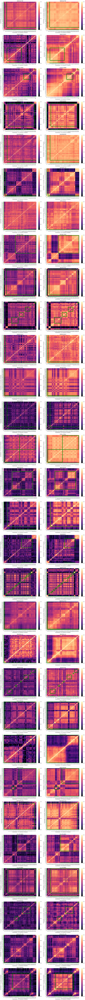

In [53]:
nrows, ncols = len(pkls), 2

fig, ax = plt.subplots(nrows, ncols, figsize=(16, nrows * 6))
    
for i, pkl in enumerate(pkls):
    with open(f"{pre_feat_path}/{pkl}", "rb") as f:
        pre_feat = pickle.load(f)
    with open(f"{tsp_feat_path}/{pkl}", "rb") as f:
        tsp_feat = pickle.load(f)

    video_id = pkl[2:-4]
    gt_annotations = annotations['database'][video_id]['annotations']
    
    sns.heatmap(cosine_similarity(torch.tensor(pre_feat)), ax=ax[i][0], vmin=0, vmax=1, cmap='magma')
    ax[i][0].invert_yaxis()
    sns.heatmap(cosine_similarity(torch.tensor(tsp_feat)), ax=ax[i][1], vmin=0, vmax=1, cmap='magma')
    ax[i][1].invert_yaxis()
    
    for gt_i, gt_annotation in enumerate(gt_annotations):
        gt_start, gt_end = gt_annotation['segment'][0], gt_annotation['segment'][1]
        gt_start, gt_end = gt_start * 2, gt_end * 2
        if True or gt_start >= 0 and gt_end <= tsp_feat.shape[0]:
            ax[i][0].plot([0, 0], [gt_start, gt_end], c='g', linestyle="-", linewidth=10)
            ax[i][0].plot([gt_start, gt_end], [0, 0], c='g', linestyle="-", linewidth=10)
            
            ax[i][1].plot([0, 0], [gt_start, gt_end], c='g', linestyle="-", linewidth=10)
            ax[i][1].plot([gt_start, gt_end], [0, 0], c='g', linestyle="-", linewidth=10)
            
            ax[i][0].add_patch(Rectangle((gt_start, gt_start), gt_end-gt_start, gt_end-gt_start, color='g', fill=False, lw=5))
            ax[i][1].add_patch(Rectangle((gt_start, gt_start), gt_end-gt_start, gt_end-gt_start, color='g', fill=False, lw=5))
        continue
    
    ax[i][0].set_title(video_id)
    ax[i][1].set_title(video_id)
    ax[i][0].set_xlabel("Clip Number (~0.5 seconds, 16 frames)")
    ax[i][1].set_xlabel("Clip Number (~0.5 seconds, 16 frames)")
    
    ax[i][0].set_ylabel("Clip Number (~0.5 seconds, 16 frames)")
    ax[i][1].set_ylabel("Clip Number (~0.5 seconds, 16 frames)")
    
plt.tight_layout()

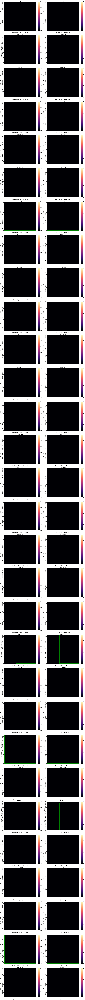

In [56]:
nrows, ncols = len(pkls), 2

fig, ax = plt.subplots(nrows, ncols, figsize=(16, nrows * 6))
    
for i, pkl in enumerate(pkls):
    with open(f"{pre_feat_path}/{pkl}", "rb") as f:
        pre_feat = pickle.load(f)
    with open(f"{tsp_feat_path}/{pkl}", "rb") as f:
        tsp_feat = pickle.load(f)

    video_id = pkl[2:-4]
    gt_annotations = annotations['database'][video_id]['annotations']
    
    sns.heatmap(torch.nn.functional.pairwise_distance(torch.tensor(pre_feat), torch.tensor(pre_feat), keepdim=True), ax=ax[i][0], vmin=0, vmax=1, cmap='magma')
    ax[i][0].invert_yaxis()
    sns.heatmap(torch.nn.functional.pairwise_distance(torch.tensor(tsp_feat), torch.tensor(tsp_feat), keepdim=True), ax=ax[i][1], vmin=0, vmax=1, cmap='magma')
    ax[i][1].invert_yaxis()
    
    for gt_i, gt_annotation in enumerate(gt_annotations):
        gt_start, gt_end = gt_annotation['segment'][0], gt_annotation['segment'][1]
        gt_start, gt_end = gt_start * 2, gt_end * 2
        if True or gt_start >= 0 and gt_end <= tsp_feat.shape[0]:
            ax[i][0].plot([0, 0], [gt_start, gt_end], c='g', linestyle="-", linewidth=10)
            ax[i][0].plot([gt_start, gt_end], [0, 0], c='g', linestyle="-", linewidth=10)
            
            ax[i][1].plot([0, 0], [gt_start, gt_end], c='g', linestyle="-", linewidth=10)
            ax[i][1].plot([gt_start, gt_end], [0, 0], c='g', linestyle="-", linewidth=10)
            
            ax[i][0].add_patch(Rectangle((gt_start, gt_start), gt_end-gt_start, gt_end-gt_start, color='g', fill=False, lw=5))
            ax[i][1].add_patch(Rectangle((gt_start, gt_start), gt_end-gt_start, gt_end-gt_start, color='g', fill=False, lw=5))
        continue
    
    ax[i][0].set_title(video_id)
    ax[i][1].set_title(video_id)
    ax[i][0].set_xlabel("Clip Number (~0.5 seconds, 16 frames)")
    ax[i][1].set_xlabel("Clip Number (~0.5 seconds, 16 frames)")
    
    ax[i][0].set_ylabel("Clip Number (~0.5 seconds, 16 frames)")
    ax[i][1].set_ylabel("Clip Number (~0.5 seconds, 16 frames)")
    
plt.tight_layout()